In [28]:
import os
import pickle
import numpy as np
from tqdm.notebook import tqdm
from google.colab import drive
from tensorflow.keras.applications.vgg16 import VGG16, preprocess_input
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.preprocessing.text import Tokenizer
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.models import Model
from tensorflow.keras.utils import to_categorical, plot_model
from tensorflow.keras.layers import Input, Dense, LSTM, Embedding, Dropout, add
from PIL import Image
import matplotlib.pyplot as plt

In [2]:
drive.mount('/content/gdrive')

Mounted at /content/gdrive


In [29]:
!wget -q https://github.com/jbrownlee/Datasets/releases/download/Flickr8k/Flickr8k_Dataset.zip
!unzip -qq Flickr8k_Dataset.zip

In [ ]:
def extract_features(imgPath):
  features = {}
  model = VGG16()
  model = Model(inputs=model.inputs, outputs=model.layers[-2].output)
  for img_name in tqdm(os.listdir(imgPath)):
    img_path = imgPath + '/' + img_name
    image = load_img(img_path, target_size=(224, 224))
    image = img_to_array(image)
    image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
    image = preprocess_input(image)
    feature = model.predict(image, verbose=0)
    image_id = img_name.split('.')[0]
    features[image_id] = feature
  
  return features

In [ ]:
filename = '/content/Flicker8k_Dataset'
features = extract_features('/content/Flicker8k_Dataset')

  0%|          | 0/8091 [00:00<?, ?it/s]

In [3]:
# pickle.dump(features,open('/content/gdrive/MyDrive/features.pkl','wb'))
features = pickle.load(open('/content/gdrive/MyDrive/features.pkl','rb'))

In [4]:
def load_captions(captions_doc):
  img_captions = {}
  for line in tqdm(captions_doc.split('\n')):
    tokens = line.split(',')
    if len(line) < 2:
        continue
    image_id, caption = tokens[0], tokens[1:]
    image_id = image_id.split('.')[0]
    caption = " ".join(caption)
    if image_id not in img_captions:
        img_captions[image_id] = []
    img_captions[image_id].append(caption)
  
  return img_captions

In [7]:
with open('/content/captions.txt', 'r') as f:
    next(f)
    captions_doc = f.read()

In [8]:
img_captions = load_captions(captions_doc)

  0%|          | 0/40456 [00:00<?, ?it/s]

In [9]:
len(img_captions)

8091

In [10]:
def clean(img_captions):
    for key, captions in img_captions.items():
        for i in range(len(captions)):
            caption = captions[i]
            caption = caption.lower()
            caption = caption.replace('[^A-Za-z]', '')
            caption = caption.replace('\s+', ' ')
            caption = 'startseq ' + " ".join([word for word in caption.split() if len(word)>1]) + ' endseq'
            captions[i] = caption
    


In [11]:
clean(img_captions)

In [12]:
img_captions

{'1000268201_693b08cb0e': ['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
  'startseq girl going into wooden building endseq',
  'startseq little girl climbing into wooden playhouse endseq',
  'startseq little girl climbing the stairs to her playhouse endseq',
  'startseq little girl in pink dress going into wooden cabin endseq'],
 '1001773457_577c3a7d70': ['startseq black dog and spotted dog are fighting endseq',
  'startseq black dog and tri-colored dog playing with each other on the road endseq',
  'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
  'startseq two dogs of different breeds looking at each other on the road endseq',
  'startseq two dogs on pavement moving toward each other endseq'],
 '1002674143_1b742ab4b8': ['startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq',
  'startseq little girl is sitting in front of large painted rainbow ends

In [13]:
def all_captions(img_captions):
  all_captions = []
  for key in img_captions:
    for caption in img_captions[key]:
        all_captions.append(caption)
  
  return all_captions

In [14]:
captions_list = all_captions(img_captions)

In [15]:
captions_list

['startseq child in pink dress is climbing up set of stairs in an entry way endseq',
 'startseq girl going into wooden building endseq',
 'startseq little girl climbing into wooden playhouse endseq',
 'startseq little girl climbing the stairs to her playhouse endseq',
 'startseq little girl in pink dress going into wooden cabin endseq',
 'startseq black dog and spotted dog are fighting endseq',
 'startseq black dog and tri-colored dog playing with each other on the road endseq',
 'startseq black dog and white dog with brown spots are staring at each other in the street endseq',
 'startseq two dogs of different breeds looking at each other on the road endseq',
 'startseq two dogs on pavement moving toward each other endseq',
 'startseq little girl covered in paint sits in front of painted rainbow with her hands in bowl endseq',
 'startseq little girl is sitting in front of large painted rainbow endseq',
 'startseq small girl in the grass plays with fingerpaints in front of white canvas 

In [16]:
tokenizer = Tokenizer()
tokenizer.fit_on_texts(captions_list)
vocabulary_size = len(tokenizer.word_index) + 1

In [17]:
max_length = max(len(caption.split()) for caption in captions_list)
max_length

35

In [18]:
image_ids = list(img_captions.keys())
split = int(len(image_ids) * 0.80)
train = image_ids[:split]
test = image_ids[split:]

In [19]:
len(train)

6472

In [20]:
len(test)

1619

In [21]:
def data_generator(data_keys, mapping, features, tokenizer, max_length, vocab_size, batch_size):
    X1, X2, y = list(), list(), list()
    n = 0
    while 1:
        for key in data_keys:
            n += 1
            captions = mapping[key]
            for caption in captions:
                seq = tokenizer.texts_to_sequences([caption])[0]
                for i in range(1, len(seq)):
                    in_seq, out_seq = seq[:i], seq[i]
                    in_seq = pad_sequences([in_seq], maxlen=max_length)[0]
                    out_seq = to_categorical([out_seq], num_classes=vocab_size)[0]
                    
                    X1.append(features[key][0])
                    X2.append(in_seq)
                    y.append(out_seq)
            if n == batch_size:
                X1, X2, y = np.array(X1), np.array(X2), np.array(y)
                yield [X1, X2], y
                X1, X2, y = list(), list(), list()
                n = 0

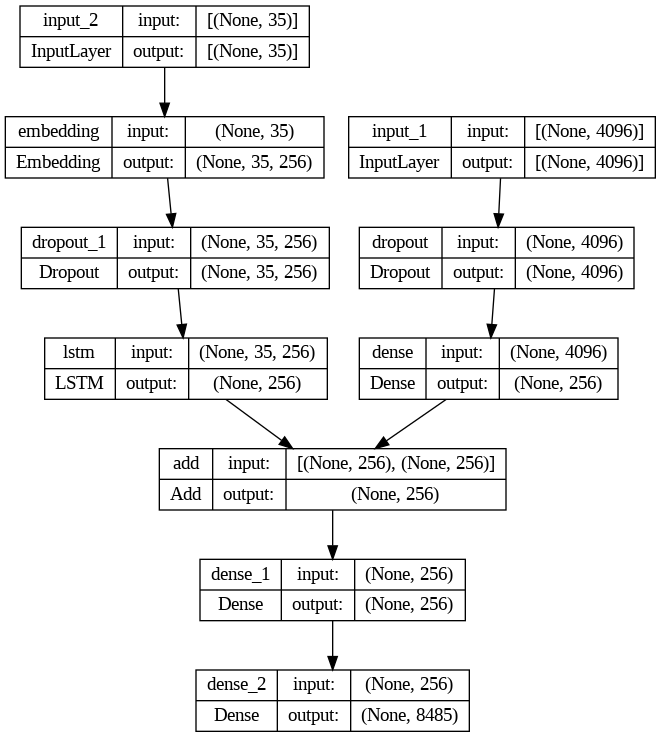

In [22]:
inputs1 = Input(shape=(4096,))
fe1 = Dropout(0.4)(inputs1)
fe2 = Dense(256, activation='relu')(fe1)

inputs2 = Input(shape=(max_length,))
se1 = Embedding(vocabulary_size, 256, mask_zero=True)(inputs2)
se2 = Dropout(0.4)(se1)
se3 = LSTM(256)(se2)

decoder1 = add([fe2, se3])
decoder2 = Dense(256, activation='relu')(decoder1)
outputs = Dense(vocabulary_size, activation='softmax')(decoder2)

model = Model(inputs=[inputs1, inputs2], outputs=outputs)
model.compile(loss='categorical_crossentropy', optimizer='adam')

plot_model(model, show_shapes=True)

In [37]:
epochs = 1
batch_size = 32
steps = len(train) 

for i in range(epochs):
    generator = data_generator(train, img_captions, features, tokenizer, max_length, vocabulary_size, batch_size)
    model.fit(generator, epochs=1, steps_per_epoch=steps, verbose=1)

6472/6472 [==============================] - 1445s 223ms/step - loss: 1.1789


In [38]:
model.save('/content/gdrive/MyDrive/Model/model.h5')

In [26]:
def word_for_id(integer, tokenizer):
  for word, index in tokenizer.word_index.items():
     if index == integer:
         return word
  return None

In [27]:
def predict_caption(model, image, tokenizer, max_length):
    in_text = 'startseq'
    for i in range(max_length):
        sequence = tokenizer.texts_to_sequences([in_text])[0]
        sequence = pad_sequences([sequence], max_length)
        pred = model.predict([image, sequence], verbose=0)
        pred = np.argmax(pred)
        word = word_for_id(pred, tokenizer)
        if word is None:
            break
        in_text += " " + word
        if word == 'endseq':
            break
      
    return in_text

In [35]:
def generate_caption(image_name):
    image_id = image_name.split('.')[0]
    img_path = os.path.join("/content/Flicker8k_Dataset", image_name)
    image = Image.open(img_path)
    captions = img_captions[image_id]
    
    y_pred = predict_caption(model, features[image_id], tokenizer, max_length)
    print(y_pred)
    plt.imshow(image)
    plt.show()

startseq dog is running on the dry ground next to man 's hair endseq


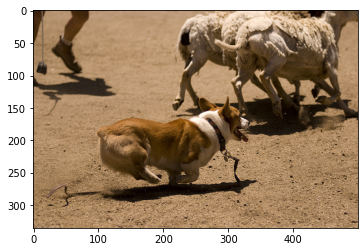

startseq woman in purple shirt is carrying very long cloth case endseq


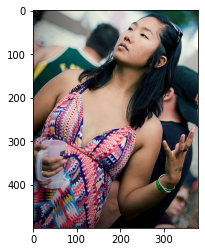

startseq teenage boy has silver ring protruding from his nose endseq


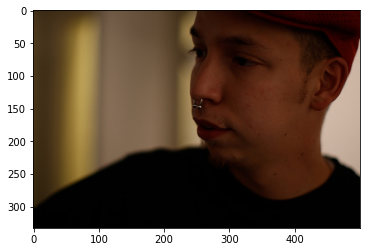

startseq three men are painting onto tires endseq


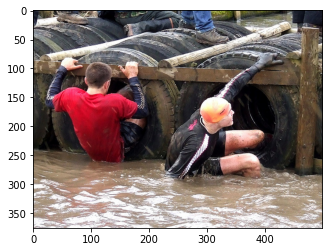

startseq man in harness is jumping into the water endseq


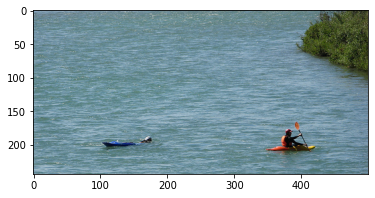

startseq three people sit on bench surrounded by flowers and litter of flags endseq


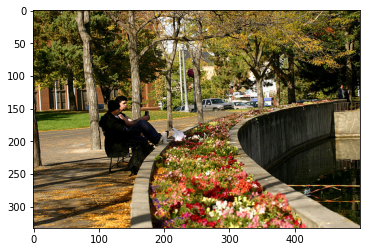

startseq baseball player hitting the ball endseq


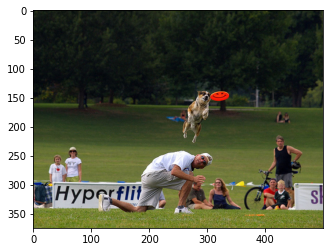

startseq two boys fooling around in pool with inflatable lifesavers endseq


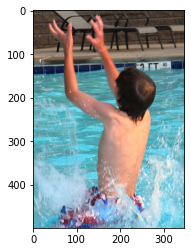

startseq black and white dog is jumping over tree limb endseq


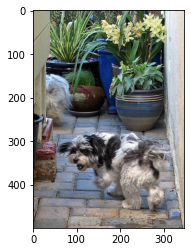

startseq man in helmet riding bike endseq


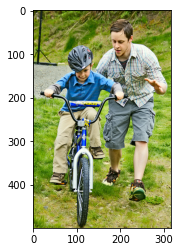

startseq black and white dog jumping over first lawn near the grass endseq


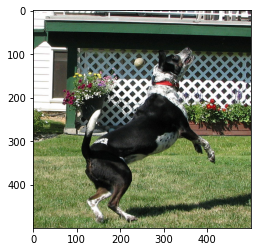

startseq two men are playing basketball in competition endseq


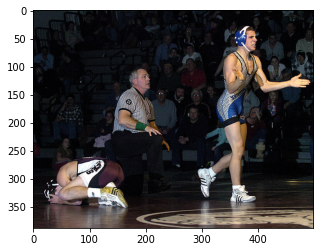

startseq three men are speaking with another people who are looking up endseq


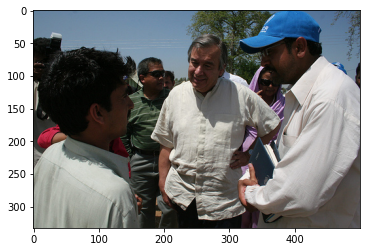

startseq seven people jumping into clear blue water endseq


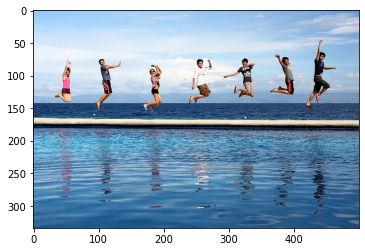

startseq man in black shirt is sitting on short step carrying skateboard endseq


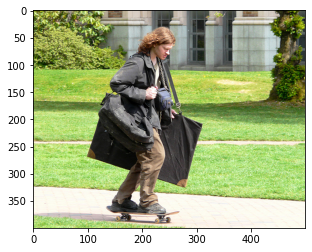

startseq four men do dance onstage together endseq


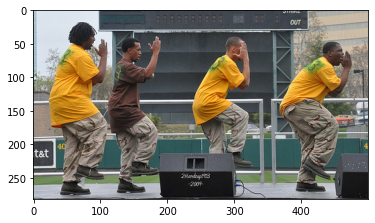

startseq two girls are in market endseq


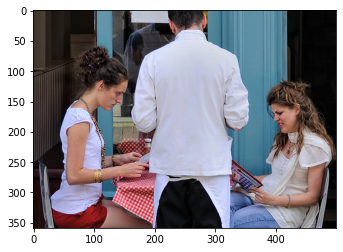

startseq man slides down railing on skateboard endseq


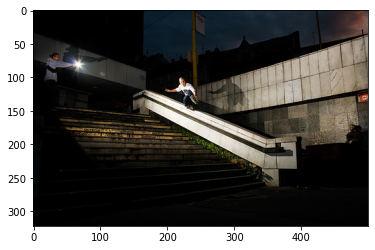

startseq man in black helmet is carrying fishing object while another man is carrying binoculars endseq


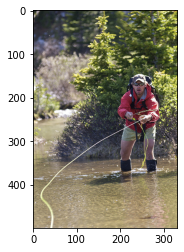

startseq three dogs play in the snow endseq


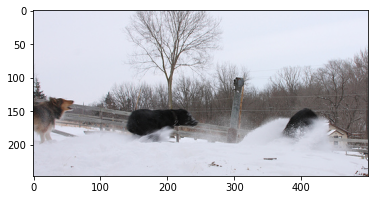

startseq woman in plaid skirt and black top stands on the phone with paddle over her endseq


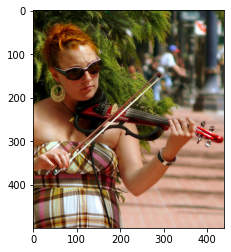

startseq two dogs run through the water at the beach endseq


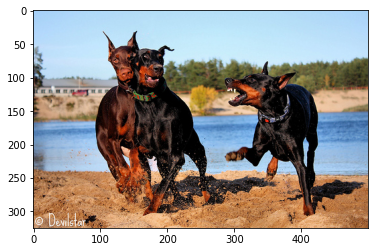

startseq three dogs playing or wrestle on the edge of the water endseq


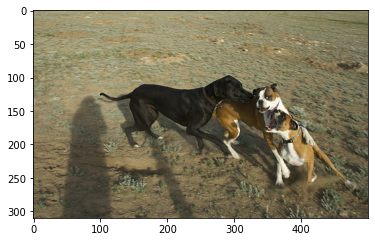

startseq person is doing jump on skateboard in an open field endseq


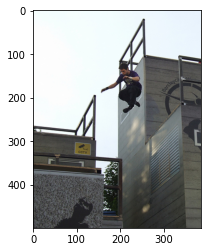

startseq basketball player dribbles the ball while the player in the blue tries to block him endseq


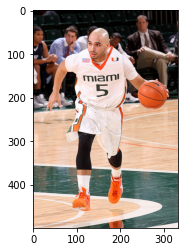

startseq two dogs are running on the grass near the woods endseq


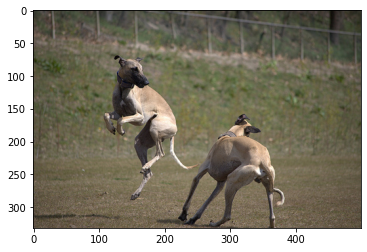

startseq man in an orange t shirt and glasses is smiling at toddler endseq


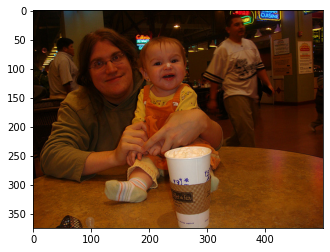

startseq young boy is wearing red outfit slides down red slide endseq


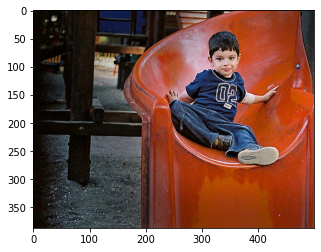

startseq the girl in the brown shirt is sitting on wooden bench next to woman holding an injured dog endseq


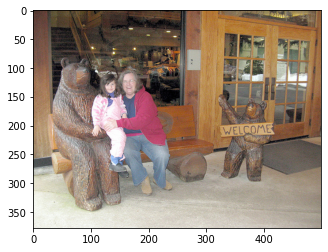

startseq three people are standing in front of an interior light skinned clothing endseq


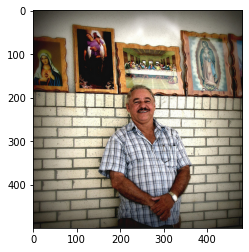

startseq dog shakes off water endseq


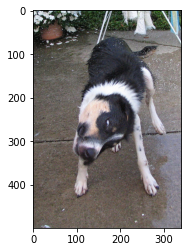

startseq two men dressed in white is running on the grass endseq


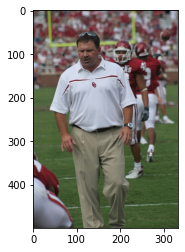

startseq two young women are smiling at the camera endseq


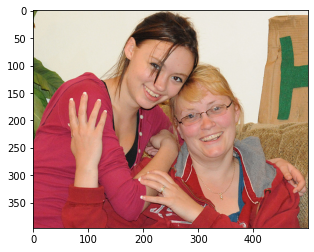

startseq black and brown dog is playing with soccer ball endseq


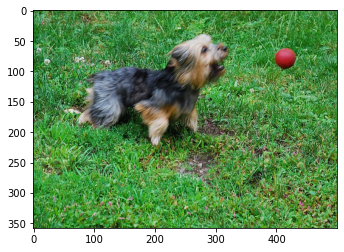

startseq man with dyed shirt and blond hair has her arm around woman in black shirt endseq


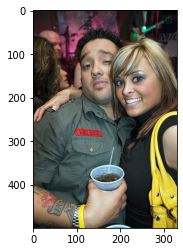

startseq a man poses for display in park with others standing few book endseq


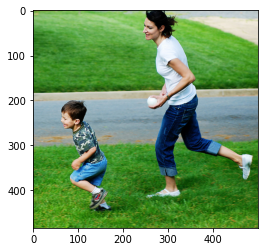

startseq three people are standing in front of an art gallery endseq


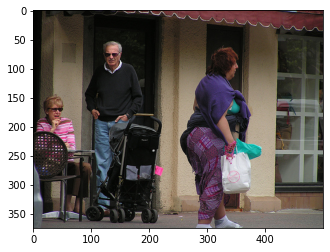

startseq two young men with water sit on their hands with water claps and them behind them endseq


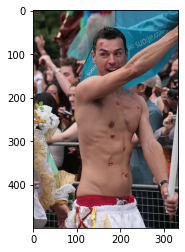

startseq man on skateboard rides on his green bicycle endseq


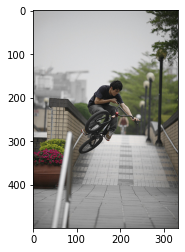

startseq the dog is running in the snow endseq


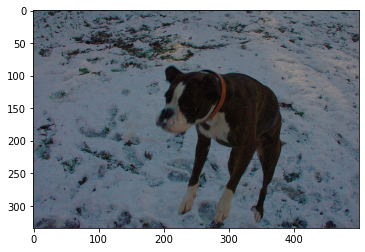

startseq woman in red shirt prepares to meal full of hamburgers endseq


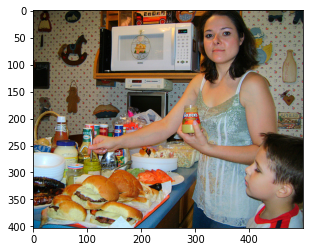

startseq mottled black and grey dog in blue collar jumping over fallen yellow pole endseq


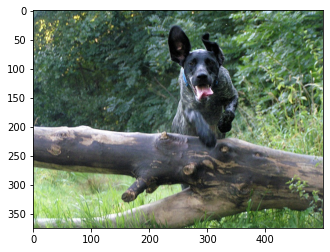

startseq a snowboarder in pink makeup waving waving chinese festival endseq


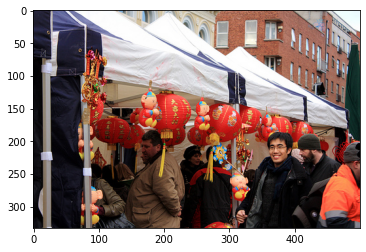

startseq man in tank top with red and black suit jumping on grass endseq


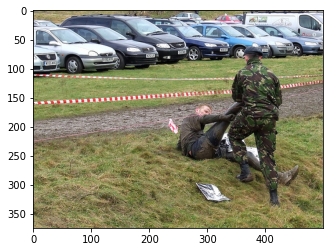

startseq man sitting in chair reading at the view of the boat endseq


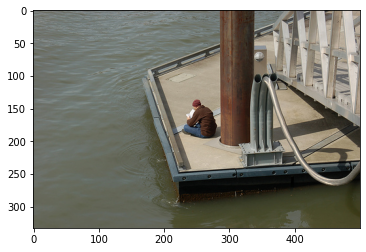

startseq baby in blue shirt is holding ball while sitting in fairground area endseq


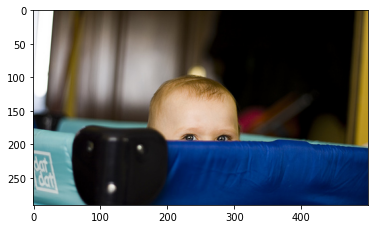

startseq dog plays with toy endseq


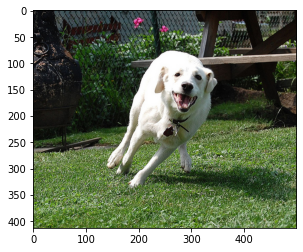

startseq girl in red top and baseball cap stands on blanket in pool of pool endseq


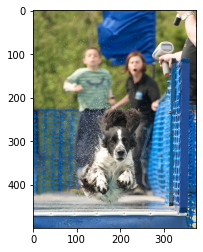

startseq two dogs run through the mud endseq


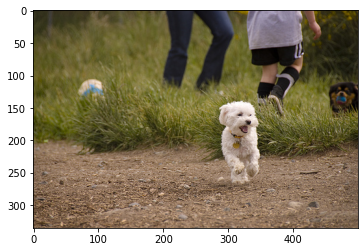

startseq dog jumps over pole in an outdoor area endseq


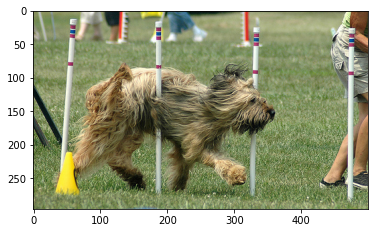

startseq boy and woman are standing on wooden fence looking at the surrounding surrounding endseq


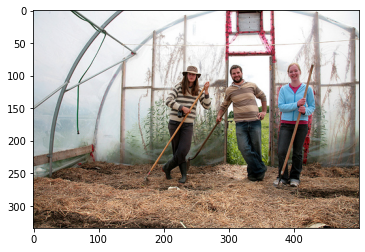

startseq wrestler spinning in ring endseq


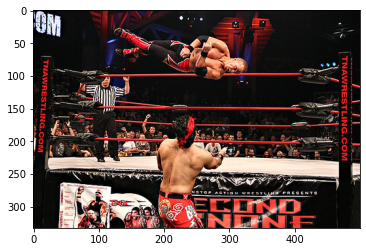

startseq man in red jacket is standing in front of tents endseq


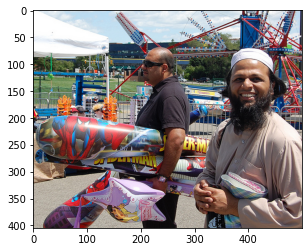

startseq black and white dog is running through an orange yard endseq


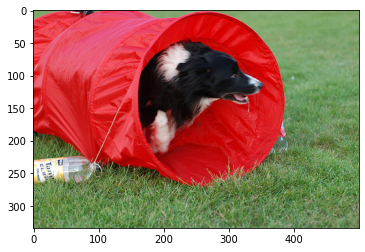

startseq two black dogs playing on the carpet with large brown one dog endseq


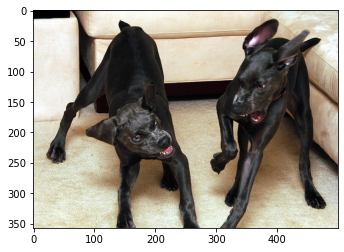

startseq baby swinging fast endseq


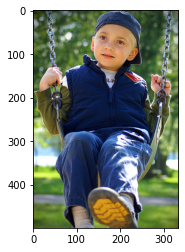

startseq four children are climbing towards water filled wall with ball in the background endseq


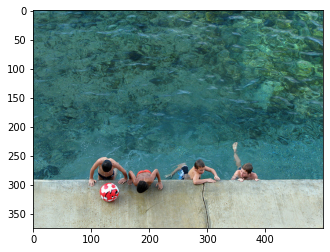

startseq black and white dog runs along the gravel road endseq


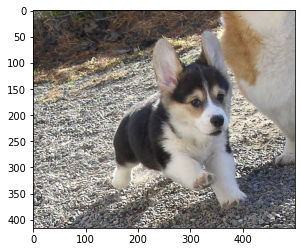

startseq dirt bike waiting over dust endseq


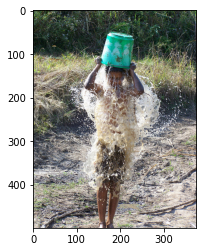

startseq climber in red and white sitting in snow endseq


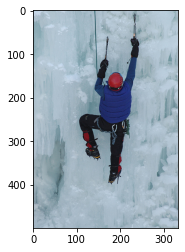

startseq brown dog is running after brown and brown dog in green field endseq


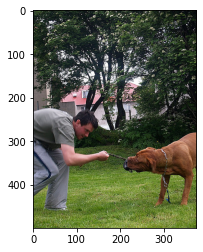

startseq black dog shakes itself dry on the beach water endseq


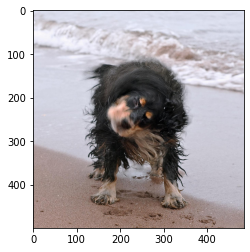

startseq car is being driven on lake endseq


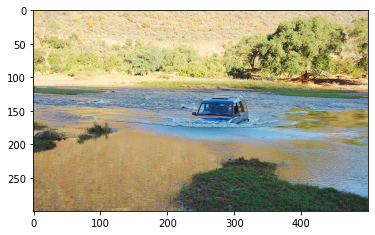

startseq man on motorcycle riding downhill endseq


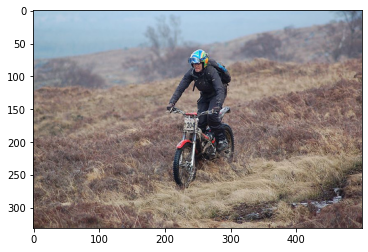

startseq dog runs through the water endseq


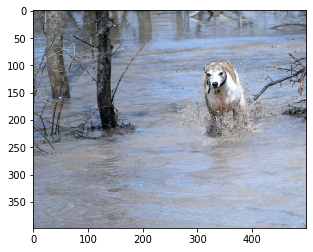

startseq woman in black wears sunglasses endseq


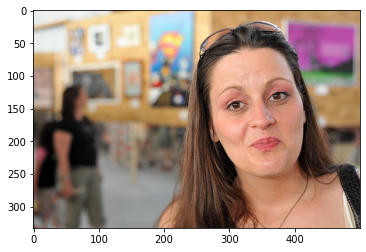

startseq two people are walking through the water at night endseq


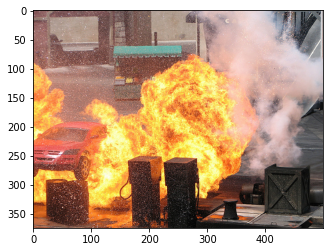

startseq the tennis player in the blue strip is throwing ball from the hand of the player in the white strip endseq


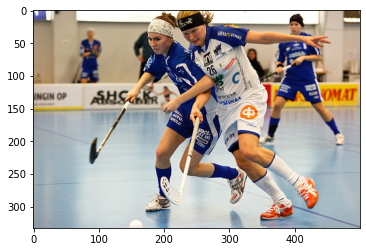

startseq boy in black and blue playing soccer endseq


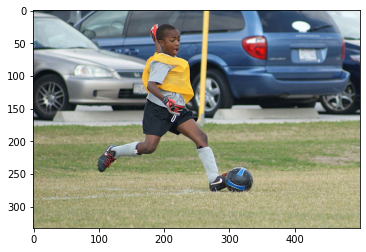

startseq boy in blue shirt and cap is on skateboard endseq


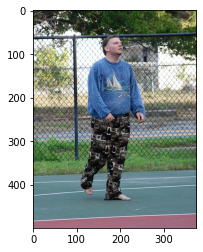

startseq man in red jacket riding bike endseq


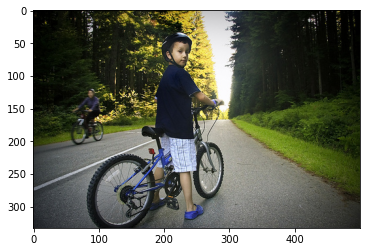

startseq man stands by table selling cart endseq


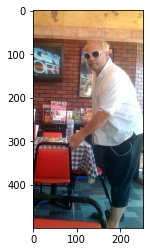

startseq two dogs are running in grassy area endseq


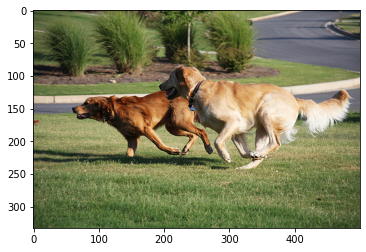

startseq man in blue shirt looks at man in black jacket who is wearing backpack and holding blue jacket endseq


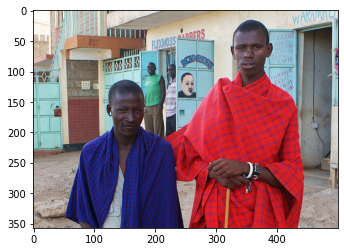

startseq girl in red tee shirts looks down and finger is standing in front of brick wall endseq


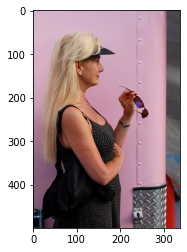

startseq two older children in their clothes are hugging each other endseq


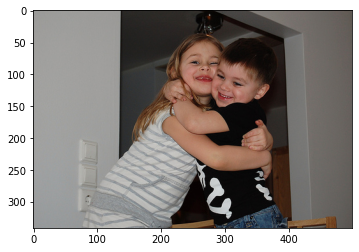

startseq three lambs are in field endseq


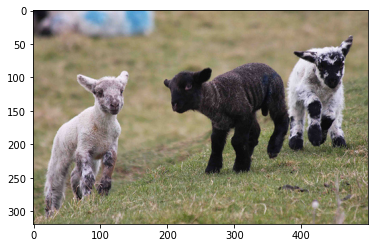

startseq man in wetsuit is surfing over white surfboard endseq


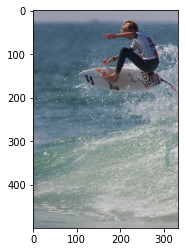

startseq dog swims toward the water while holding long stick endseq


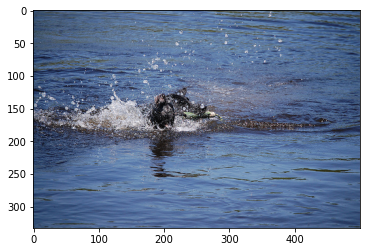

startseq the young girl is covering their head and is in front of the ocean endseq


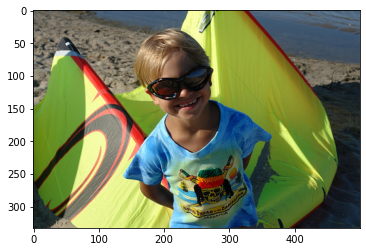

startseq young girl in red dress is standing in front of rainbow painting endseq


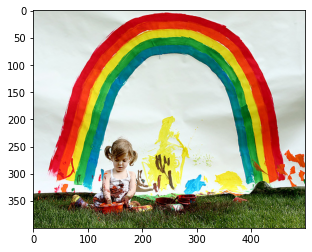

startseq boy in red shirt jumps off wooden plank into the air endseq


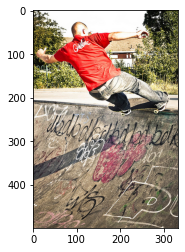

startseq two boats are in the ocean endseq


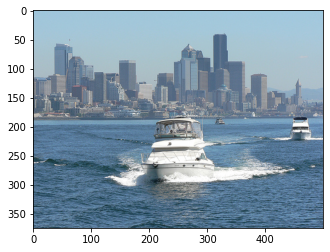

startseq group of people are standing in red smoke that is passing by red building endseq


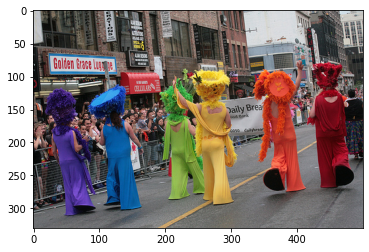

startseq two dogs are playing together in the grass endseq


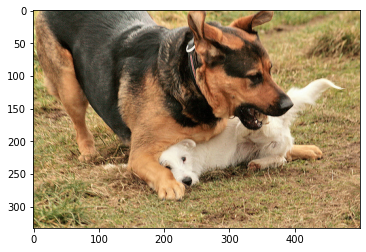

startseq woman in blue shirt is standing in front of railing while woman is sitting next to her endseq


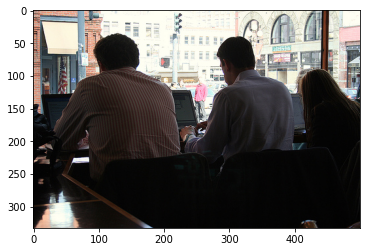

startseq boy in red tank top skateboarding on cement track in the city endseq


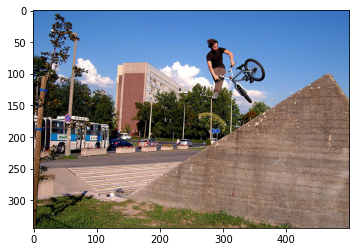

startseq two women playing on the grass endseq


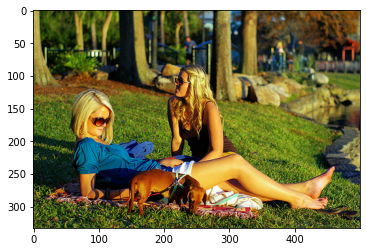

startseq group of people surf on large wave in the ocean endseq


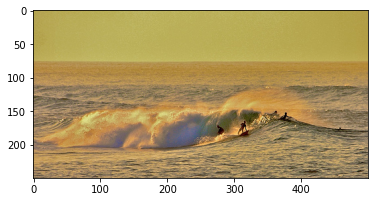

startseq man is snowboarding down large wave endseq


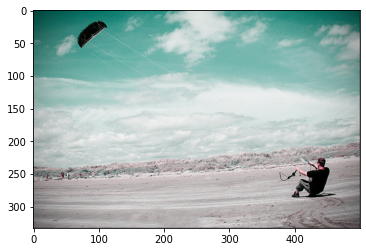

startseq two men and woman are praying or meditating endseq


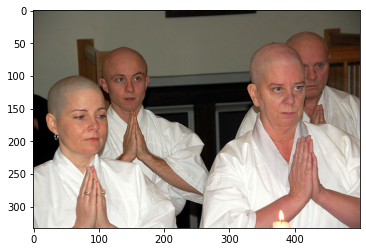

startseq two dogs are running in the grass endseq


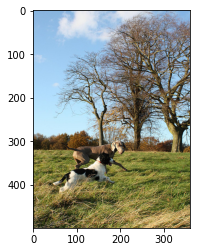

startseq skier in red jacket is standing in the snow endseq


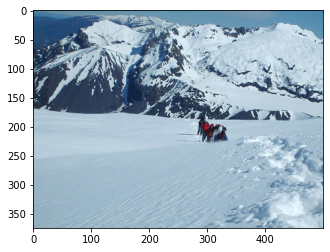

startseq two young boys are standing in front of large bush in front of trees endseq


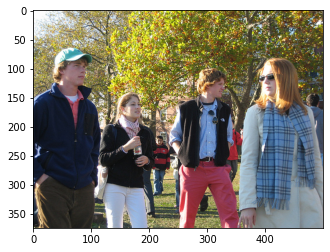

startseq woman with brown hair wears white t shirt with crowd of other people behind him endseq


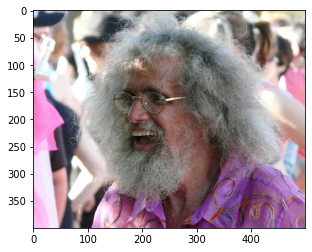

startseq dog drinks water on road endseq


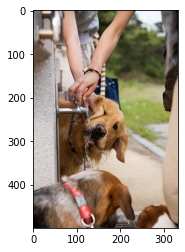

startseq three dogs running on dirty water endseq


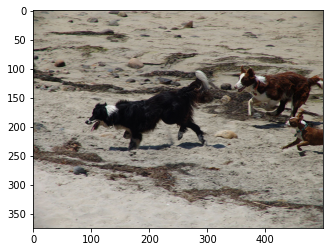

startseq group of people dancing in line as crowd surrounding them endseq


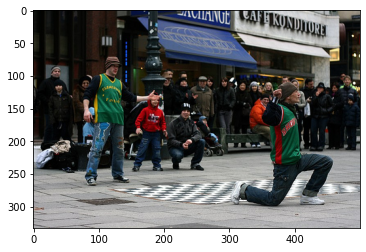

startseq woman sitting on turquoise bench with pillow and bag near restaurant endseq


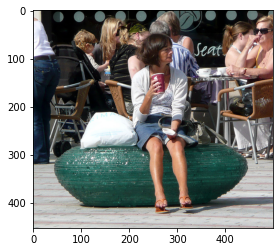

In [39]:
img_count = 100
i = 1
for img in os.listdir('/content/Flicker8k_Dataset'):
  if i == img_count:
    break
  generate_caption(img)
  i += 1